In [1]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import numpy as np
import pickle
import torch

from IPython.display import HTML

In [2]:
with open("../Car Racing/data/obs_train.pkl", "rb") as f:
    states = pickle.load(f)
with open("../Car Racing/data/real_actions.pkl", "rb") as f:
    actions = pickle.load(f)

In [10]:
states = np.array([item for sublist in states for item in sublist])

1


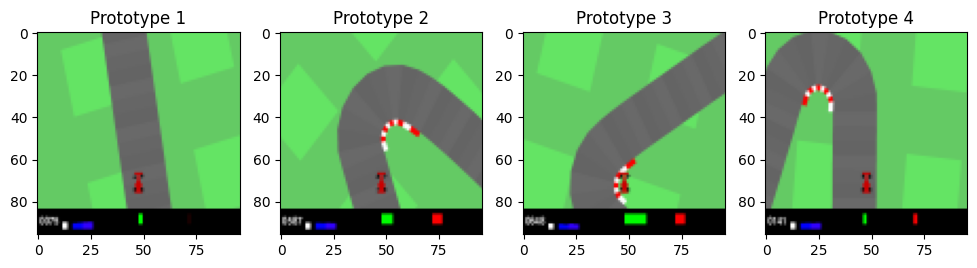

In [61]:
prototype_idxs = [15964, 20140, 9021, 18976]
num_prototypes = len(prototype_idxs)
ncols = 4
nrows = 1 + (num_prototypes - 1) // ncols
print(nrows)
fig = plt.figure(figsize=(12, 12*4))
for i, idx in enumerate(prototype_idxs):
    ax = fig.add_subplot(nrows, ncols, i+1)
    ax.imshow(states[idx])
    ax.set_title(f"Prototype {i+1}")
# fig.tight_layout()
plt.show()

In [69]:
torch.prod(t.size())

TypeError: prod(): argument 'input' (position 1) must be Tensor, not torch.Size

/tmp/ipykernel_30651/978856944.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ylabs)
/tmp/ipykernel_30651/978856944.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabs)


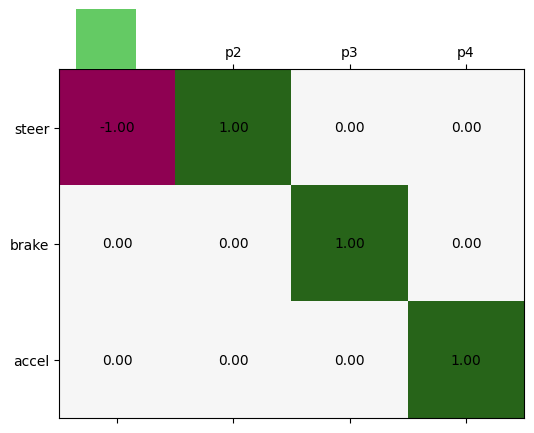

In [59]:
prototype_idxs = [15964, 20140, 9021, 18976]
num_prototypes = len(prototype_idxs)
ncols = 4
nrows = 1 + (num_prototypes - 1) // ncols

t = torch.Tensor([[-1, 1, 0, 0], [0, 0, 1, 0], [0, 0, 0, 1]])
ylabs = ['', 'steer', 'brake', 'accel']
xlabs = [''] + [f'p{i+1}' for i in range(num_prototypes)]

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(1, 1, 1)

ax.matshow(t, cmap='PiYG')
for i in range(t.shape[0]):
    for j in range(t.shape[1]):
        ax.annotate(f'{t[i, j].item():.2f}', (j, i), ha="center", va="center")
ax.set_yticklabels(ylabs)
ax.set_xticklabels(xlabs)

xl, yl, xh, yh=np.array(ax.get_position()).ravel()
w=xh-xl
h=yh-yl
xp=xl+w*0.1 #if replace '0' label, can also be calculated systematically using xlim()
size=0.1
ax1=fig.add_axes([xp-size*0.5, yh, size, size])
ax1.axison = False
imgplot = ax1.imshow(states[9021],transform=ax.transAxes)


plt.show()

In [54]:
t.abs().max().item()


tensor(1.)

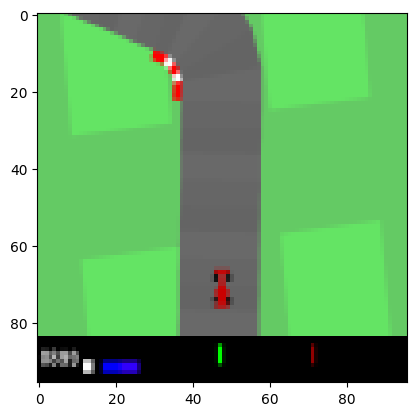

In [ ]:
ims = []
fig = plt.figure()

for t in states[0]:
    im = plt.imshow(t, animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)

HTML(ani.to_jshtml())